In [235]:
import json
from pathlib import Path

import matplotlib.pyplot as plt
from collections import Counter

import pandas as pd
import numpy as np
import seaborn as sns

output_dir = Path("outputs")

csv_files = sorted(output_dir.glob("*.csv"))
json_files = sorted(output_dir.glob("*_variants.json"))
base_files = sorted(output_dir.glob("base_hyper_params_*.json"))


csv_data = {path.name: pd.read_csv(path) for path in csv_files}
json_data = {
    path.name: json.loads(path.read_text(encoding="utf-8"))
    for path in json_files
}


base_hyperparameters = {
    path.name: json.loads(path.read_text(encoding="utf-8"))
    for path in base_files
}
print("Loaded CSV files:", list(csv_data.keys()))
print("Loaded JSON files:", list(json_data.keys()))
print("Loaded Base Hyperparameter files:", list(base_hyperparameters.keys()))

print("CSV DataFrame sample:")
print(csv_data[list(csv_data.keys())[-1]].head())

print("\nJSON Data sample:")
sample_json_key = list(json_data.keys())[-1]
print(f"{sample_json_key}:")
print(json.dumps(json_data[sample_json_key], indent=2))

Loaded CSV files: ['bert_experiment_results_2026-05-17_11-35-07.csv', 'bert_experiment_results_2026-05-17_13-53-02.csv', 'bert_experiment_results_2026-05-17_16-02-45.csv', 'bert_experiment_results_2026-05-18_13-08-33.csv', 'bert_experiment_results_2026-05-21_17-15-26.csv', 'bert_experiment_results_2026-05-21_22-23-54.csv', 'bert_experiment_results_2026-05-22_13-17-54.csv']
Loaded JSON files: ['bert_experiment_results_2026-05-17_11-35-07_variants.json', 'bert_experiment_results_2026-05-17_13-53-02_variants.json', 'bert_experiment_results_2026-05-17_16-02-45_variants.json', 'bert_experiment_results_2026-05-18_13-08-33_variants.json', 'bert_experiment_results_2026-05-21_17-15-26_variants.json', 'bert_experiment_results_2026-05-21_22-23-54_variants.json', 'bert_experiment_results_2026-05-22_13-17-54_variants.json']
Loaded Base Hyperparameter files: ['base_hyper_params_2026-05-21_17-15-26.json', 'base_hyper_params_2026-05-22_13-17-54.json', 'base_hyper_params_init.json']
CSV DataFrame sampl

## Utility functions

In [236]:
LABELS = ["SUPPORTS", "REFUTES", "NOT_ENOUGH_INFO", "DISPUTED"]
graph_dir = output_dir / "graphs"
graph_dir.mkdir(exist_ok=True)

In [237]:
def _resolve_base_hyperparameters(base_hyperparameters):
    if not isinstance(base_hyperparameters, dict):
        return {}
    return base_hyperparameters

def _normalize_param_value(value):
    try:
        numeric = float(value)
        return int(numeric) if numeric.is_integer() else numeric
    except Exception:
        return str(value)

def _find_base_value(param, available_values, base_hyperparameters):
    base_map = _resolve_base_hyperparameters(base_hyperparameters)
    if param not in base_map:
        return None
    target = _normalize_param_value(base_map[param])
    normalized_available = {_normalize_param_value(value): value for value in available_values}
    return normalized_available.get(target)

def _is_numeric_series(values):
    return not pd.to_numeric(pd.Series(values), errors='coerce').isna().all()

def _maybe_scatter(ax, x, y, **kwargs):
    if x is None or y is None or pd.isna(y):
        return
    ax.scatter([x], [float(y)], **kwargs)

def _set_metric_axis_limits(ax, series_list, floor=0.0, pad_ratio=0.08, min_span=0.02):
    values = []
    for series in series_list:
        numeric = pd.to_numeric(pd.Series(series), errors='coerce').dropna()
        if not numeric.empty:
            values.extend(numeric.tolist())
    if not values:
        ax.set_ylim(0, 1)
        return
    y_min = min(values)
    y_max = max(values)
    span = max(y_max - y_min, min_span)
    lower = max(floor, y_min - span * pad_ratio)
    upper = min(1.0, y_max + span * pad_ratio)
    if upper <= lower:
        upper = min(1.0, lower + min_span)
    ax.set_ylim(lower, upper)

def plot_hyper_param_impacts(variant_experiments, base_hyperparameters):
    if not variant_experiments:
        print("No experiment results available. Run the experiment cell first.")
        return

    rows = []
    for param, values in variant_experiments.items():
        for value, details in values.items():
            results = details.get("results", {}) if isinstance(details, dict) else {}
            metrics = results.get("Full System", {}) if isinstance(results, dict) else {}
            rows.append({
                "parameter": param,
                "value": value,
                "F": metrics.get("F", np.nan),
                "A": metrics.get("A", np.nan),
                "H": metrics.get("H", np.nan),
            })

    experiment_df = pd.DataFrame(rows)
    if experiment_df.empty:
        print("No Full System metrics found in variant experiment JSON.")
        return

    params = experiment_df['parameter'].unique()
    for param in params:
        subset = experiment_df[experiment_df['parameter'] == param].copy()
        subset['sort_value'] = pd.to_numeric(subset['value'], errors='coerce')
        is_numeric = _is_numeric_series(subset['value'].tolist())
        if not is_numeric:
            subset = subset.sort_values('value')
        else:
            subset = subset.sort_values('sort_value')

        base_value = _find_base_value(param, subset['value'].tolist(), base_hyperparameters)

        color_f = 'tab:blue'
        color_a = 'tab:orange'
        color_h = 'tab:green'
        base_color = 'crimson'

        fig, ax = plt.subplots(figsize=(10, 4))
        x_labels = [str(v) for v in subset['value'].tolist()]
        if is_numeric:
            x_vals = subset['sort_value'].astype(float).tolist()
            ax.plot(x_vals, subset['F'], marker='o', color=color_f, label='F-score')
            ax.plot(x_vals, subset['H'], marker='o', color=color_h, label='Harmonic Mean', linestyle='--')
        else:
            x_vals = list(range(len(subset)))
            width = 0.25
            ax.bar([x - width / 2 for x in x_vals], subset['F'], width=width, color=color_f, label='F-score')
            ax.bar([x + width / 2 for x in x_vals], subset['H'], width=width, color=color_h, label='Harmonic Mean', alpha=0.85)
        ax.set_title(f"{param} Impact")
        ax.set_xlabel('Value')
        ax.set_ylabel('F-score / Harmonic Mean', color=color_f)
        ax.tick_params(axis='y', labelcolor=color_f)
        ax.set_xticks(x_vals)
        ax.set_xticklabels(x_labels, rotation=45)

        ax2 = ax.twinx()
        if is_numeric:
            ax2.plot(x_vals, subset['A'], marker='s', color=color_a, label='Accuracy')
        else:
            width = 0.25
            ax2.bar([x + 1.5 * width for x in x_vals], subset['A'], width=width, color=color_a, label='Accuracy', alpha=0.65)
        ax2.set_ylabel('Accuracy', color=color_a)
        ax2.tick_params(axis='y', labelcolor=color_a)
        _set_metric_axis_limits(ax, [subset['F'], subset['H']])
        _set_metric_axis_limits(ax2, [subset['A']])

        if base_value is not None:
            base_row = subset[subset['value'].astype(str) == str(base_value)].iloc[0]
            if is_numeric:
                base_x = float(base_value)
            else:
                base_x = x_labels.index(str(base_value)) if str(base_value) in x_labels else None
            if base_x is not None:
                ax.axvline(base_x, color=base_color, linestyle=':', linewidth=2, label='Base Value')
            if is_numeric:
                _maybe_scatter(ax, base_x, base_row['F'], color=base_color, edgecolors='black', s=90, zorder=5)
                _maybe_scatter(ax, base_x, base_row['H'], color=base_color, edgecolors='black', s=90, marker='D', zorder=5)
                _maybe_scatter(ax2, base_x, base_row['A'], color=base_color, edgecolors='black', s=90, marker='s', zorder=5)
            else:
                width = 0.25
                _maybe_scatter(ax, base_x - width / 2, base_row['F'], color=base_color, edgecolors='black', s=90, zorder=5)
                _maybe_scatter(ax, base_x + width / 2, base_row['H'], color=base_color, edgecolors='black', s=90, marker='D', zorder=5)
                _maybe_scatter(ax2, base_x + 1.5 * width, base_row['A'], color=base_color, edgecolors='black', s=90, marker='s', zorder=5)

        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines + lines2, labels + labels2, loc='upper left')

        ax.grid(True, alpha=0.3)
        plt.tight_layout()
        
        #save the plots in outputs_graphs
        graph_dir.mkdir(exist_ok=True)
        plt.savefig(graph_dir / f"{param}_impact.png")            
        
        plt.show()

def plot_hyperparameter_impacts(variant_experiments, base_hyperparameters=None):
    if base_hyperparameters is None:
        base_hyperparameters = globals().get("base_hyperparameters", {})
    plot_hyper_param_impacts(variant_experiments, base_hyperparameters)

In [238]:
def diagnostic_plots_grouped(variant_experiments,base_hyperparameters):
    import pandas as _pd

    for param, values in variant_experiments.items():
        print(f"\n=== Diagnostic Summary for {param} ===")

        # Collect and sort parameter values for consistent plotting
        value_keys = list(values.keys())
        try:
            # numeric sort if possible (ints/floats)
            sorted_keys = sorted(value_keys, key=lambda x: float(x))
        except Exception:
            # fallback to string ordering
            sorted_keys = list(value_keys)

        base_value = _find_base_value(param, sorted_keys, base_hyperparameters)

        labels = LABELS
        metrics = ["precision", "recall", "f1-score"]

        # Build a wide dataframe: index=sorted_keys, columns=(label,metric)
        records = []
        for key in sorted_keys:
            row = {"_param_value": key}
            details = values.get(key, {}) or {}
            results = details.get("results", {}) if isinstance(details, dict) else {}
            diagnostics = results.get("Diagnostic", {}) if isinstance(results, dict) else {}

            for label in labels:
                lab = diagnostics.get(label, {})
                for m in metrics:
                    row[f"{label}|{m}"] = lab.get(m, float("nan"))

            records.append(row)

        if not records:
            print(f"No diagnostic results available for {param}")
            continue

        df = _pd.DataFrame.from_records(records).set_index("_param_value")

        # Prepare x positions and labels for plotting
        is_numeric = _is_numeric_series(df.index.tolist())
        if is_numeric:
            x_vals = [float(x) for x in df.index]
            x_labels = [str(x) for x in df.index]
        else:
            x_vals = list(range(len(df.index)))
            x_labels = [str(x) for x in df.index]

        # Create one row of subplots (one per metric) and plot each label as a separate line
        fig, axes = plt.subplots(nrows=1, ncols=len(metrics), figsize=(5 * len(metrics), 4), squeeze=False)
        axes = axes.flatten()

        for ai, metric in enumerate(metrics):
            ax = axes[ai]
            for label in labels:
                col = f"{label}|{metric}"
                if col in df.columns:
                    try:
                        y = df[col].astype(float).values
                    except Exception:
                        y = df[col].values
                    if is_numeric:
                        ax.plot(x_vals, y, marker="o", label=label)
                    else:
                        width = 0.18
                        offset = (labels.index(label) - (len(labels) - 1) / 2) * width
                        ax.bar([x + offset for x in x_vals], y, width=width, label=label, alpha=0.85)

            ax.set_title(metric.capitalize())
            ax.set_ylim(0, 1)
            ax.set_xlabel(param)
            ax.set_xticks(x_vals)
            ax.set_xticklabels(x_labels, rotation=45)
            if base_value is not None:
                if is_numeric:
                    base_x = float(base_value)
                else:
                    base_x = x_labels.index(str(base_value)) if str(base_value) in x_labels else None
                if base_x is not None:
                    ax.axvline(base_x, color='crimson', linestyle=':', linewidth=2, label='Base Value')
                    for label in labels:
                        col = f"{label}|{metric}"
                        if col in df.columns and str(base_value) in df.index.astype(str):
                            base_y = float(df.loc[base_value, col]) if pd.notna(df.loc[base_value, col]) else None
                            if base_y is not None:
                                if is_numeric:
                                    marker_x = base_x
                                else:
                                    width = 0.18
                                    marker_x = base_x + (labels.index(label) - (len(labels) - 1) / 2) * width
                                ax.scatter([marker_x], [base_y], color='crimson', edgecolors='black', s=70, zorder=5)
            ax.grid(True, alpha=0.3)
            ax.legend()

        plt.tight_layout()
        
        #save the plots in outputs_graphs
        graph_dir.mkdir(exist_ok=True)
        plt.savefig(graph_dir / f"{param}_diagnostic.png")
        
        plt.show()

In [239]:
def _conf_matrix_to_array(conf_matrix, labels):
    if isinstance(conf_matrix, dict):
        conf_matrix = [[conf_matrix[true_label][pred_label] for pred_label in labels] for true_label in labels]
    return np.array(conf_matrix)

def _normalize_conf_matrix(conf_matrix):
    row_sums = conf_matrix.sum(axis=1, keepdims=True)
    return np.divide(conf_matrix, row_sums, out=np.zeros_like(conf_matrix, dtype=float), where=row_sums != 0)

def confusion_matrix_heatmap(conf_matrix, labels, title, ax=None, vmin=None, vmax=None, show_colorbar=True, normalize=False):
    conf_matrix = _conf_matrix_to_array(conf_matrix, labels)
    plot_matrix = _normalize_conf_matrix(conf_matrix) if normalize else conf_matrix
    
    standalone = ax is None
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 5))
    
    sns.heatmap(
        plot_matrix,
        annot=True,
        fmt='.2f' if normalize else 'd',
        cmap='Blues',
        xticklabels=labels,
        yticklabels=labels,
        ax=ax,
        vmin=vmin,
        vmax=vmax,
        cbar=show_colorbar,
    )
    ax.set_title(title)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    
    if standalone:
        plt.tight_layout()
        
        #save the plots in outputs_graphs
        graph_dir = output_dir / "graphs"
        graph_dir.mkdir(exist_ok=True)
        suffix = "_normalized" if normalize else ""
        plt.savefig(graph_dir / f"{title.replace(' ', '_')}_confusion_matrix{suffix}.png")
        
        plt.show()

def confusion_matrices_comparison(variant_experiments, labels, normalize=False, base_hyperparameters=None):
    for param, values in variant_experiments.items():
        comparison_type = "Normalized Confusion Matrix Comparison" if normalize else "Confusion Matrix Comparison"
        print(f"\n=== {comparison_type} for {param} ===")

        value_keys = list(values.keys())
        try:
            sorted_keys = sorted(value_keys, key=lambda x: float(x))
        except Exception:
            sorted_keys = list(value_keys)

        base_value = _find_base_value(param, sorted_keys, base_hyperparameters)
        print(f"Base value for {param}: {base_value}")

        matrices = []
        titles = []
        is_base_flags = []
        for value in sorted_keys:
            details = values.get(value, {}) if isinstance(values, dict) else {}
            results = details.get("results", {}) if isinstance(details, dict) else {}
            conf_matrix = results.get("Confusion Matrix", None)
            if conf_matrix is not None:
                matrices.append(_conf_matrix_to_array(conf_matrix, labels))
                is_base = str(value) == str(base_value)
                title_suffix = " (base)" if is_base else ""
                titles.append(f"{param}={value}{title_suffix}")
                is_base_flags.append(is_base)

        if not matrices:
            print("No confusion matrices found.")
            continue

        vmax = 1 if normalize else max(matrix.max() for matrix in matrices)
        cols = min(3, len(matrices))
        rows = int(np.ceil(len(matrices) / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4.5 * rows), squeeze=False)
        axes_flat = axes.flatten()

        for idx, (matrix, title, is_base) in enumerate(zip(matrices, titles, is_base_flags)):
            confusion_matrix_heatmap(
                matrix,
                labels,
                title,
                ax=axes_flat[idx],
                vmin=0,
                vmax=vmax,
                show_colorbar=(idx == len(matrices) - 1),
                normalize=normalize,
            )
            if is_base:
                for spine in axes_flat[idx].spines.values():
                    spine.set_visible(True)
                    spine.set_linewidth(3)
                    spine.set_edgecolor('crimson')

        for idx in range(len(matrices), len(axes_flat)):
            axes_flat[idx].axis('off')

        figure_title = f"Normalized Confusion Matrices for {param}" if normalize else f"Confusion Matrices for {param}"
        fig.suptitle(figure_title, fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.97])

        graph_dir.mkdir(exist_ok=True)
        suffix = "_normalized" if normalize else ""
        plt.savefig(graph_dir / f"{param}_confusion_matrices_comparison{suffix}.png")
        plt.show()

In [240]:
def confusion_matrices_from_variants(variant_experiments,base_hyperparameters):
    # confusion_matrices_comparison(variant_experiments, LABELS, normalize=False, base_hyperparameters=base_hyperparameters)
    confusion_matrices_comparison(variant_experiments, LABELS, normalize=True, base_hyperparameters=base_hyperparameters)

In [241]:
def plot_hyperparameter_impacts(variant_experiments, base_hyperparameters=None):
    if base_hyperparameters is None:
        base_hyperparameters = globals().get("base_hyperparameters", {})
    plot_hyper_param_impacts(variant_experiments, base_hyperparameters)

In [242]:
def get_latex_table_from_experiments(variant_experiments, base_hyperparameters):
    import pandas as _pd

    rows = []
    for param, values in variant_experiments.items():
        base_value = _find_base_value(param, list(values.keys()), base_hyperparameters)
        for value, details in values.items():
            results = details.get("results", {}) if isinstance(details, dict) else {}
            metrics = results.get("Full System", {}) if isinstance(results, dict) else {}
            f_score = metrics.get("F", float("nan"))
            accuracy = metrics.get("A", float("nan"))
            mean = metrics.get("H", float("nan"))

            # diagnostics = results.get("Retrieval Diagnostics", {}) if isinstance(results, dict) else {}
            # claims_correct = diagnostics.get("claims_with_correct_evidence", float("nan"))
            # total_claims = diagnostics.get("total_claims", float("nan"))
            # percent_correct_claims = claims_correct / total_claims if total_claims else float("nan")
            
            is_base = str(value) == str(base_value)
            rows.append({
                "Parameter": param,
                "Value": value,
                "F-score": f_score,
                "Accuracy": accuracy,
                "Harmonic Mean": mean,
                # "Percent Correct Claims": percent_correct_claims,
                # "Base": is_base
            })

    df = _pd.DataFrame(rows)
    df.sort_values(by=["Parameter", "Value"], inplace=True)

    latex_table = df.to_latex(index=False, float_format="%.7f", column_format="lccr", caption="Experiment Results with Base Highlighted")
    
    #save the LaTeX table in outputs_graphs
    table_path = graph_dir / "experiment_results_table.tex"
    with open(table_path, "w", encoding="utf-8") as f:
        f.write(latex_table)
    
    return latex_table

## plots

\begin{table}
\caption{Experiment Results with Base Highlighted}
\begin{tabular}{lccr}
\toprule
Parameter & Value & F-score & Accuracy & Harmonic Mean \\
\midrule
CHECKPOINT_SELECTION_METRIC & accuracy & 0.0071079 & 0.4415584 & 0.0139905 \\
CHECKPOINT_SELECTION_METRIC & harmonic & 0.0071079 & 0.4675325 & 0.0140028 \\
CLASS_WEIGHT_POWER & 0.0 & 0.0071079 & 0.4350649 & 0.0139872 \\
CLASS_WEIGHT_POWER & 0.5 & 0.0071079 & 0.4675325 & 0.0140028 \\
CLASS_WEIGHT_POWER & 0.75 & 0.0071079 & 0.4415584 & 0.0139905 \\
CLASS_WEIGHT_POWER & 1.0 & 0.0071079 & 0.4935065 & 0.0140139 \\
HYBRID_CANDIDATE_POOL & 100 & 0.0071079 & 0.4610390 & 0.0139999 \\
HYBRID_CANDIDATE_POOL & 200 & 0.0071079 & 0.4675325 & 0.0140028 \\
HYBRID_CANDIDATE_POOL & 300 & 0.0071079 & 0.5324675 & 0.0140285 \\
HYBRID_CANDIDATE_POOL & 400 & 0.0071079 & 0.4675325 & 0.0140028 \\
HYBRID_CANDIDATE_POOL & 50 & 0.0071079 & 0.5454545 & 0.0140329 \\
HYBRID_CANDIDATE_POOL & 500 & 0.0071079 & 0.4935065 & 0.0140139 \\
LEARNING_RATE & 1e-05 &

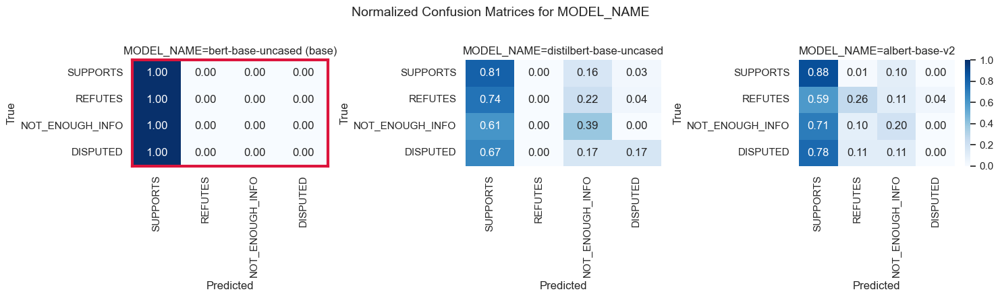


=== Normalized Confusion Matrix Comparison for TOP_K ===
Base value for TOP_K: 3


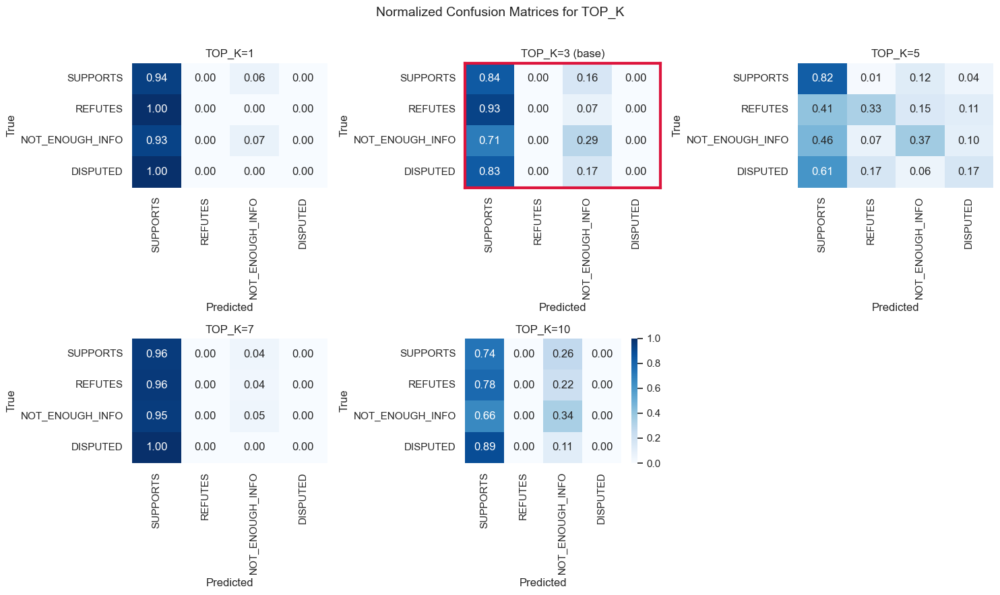


=== Normalized Confusion Matrix Comparison for TFIDF_MAX_FEATURES ===
Base value for TFIDF_MAX_FEATURES: 500000


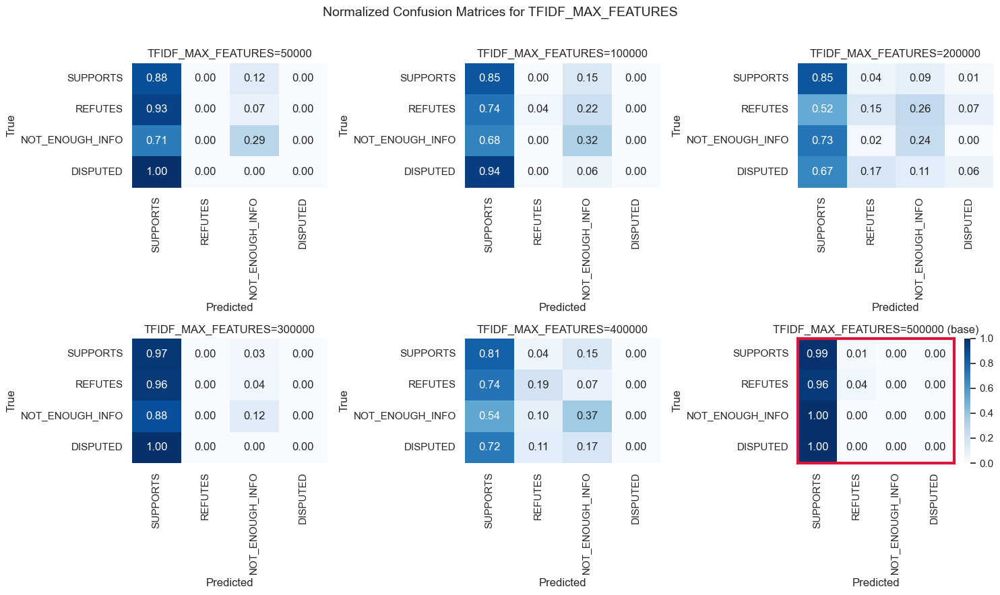


=== Normalized Confusion Matrix Comparison for HYBRID_CANDIDATE_POOL ===
Base value for HYBRID_CANDIDATE_POOL: 500


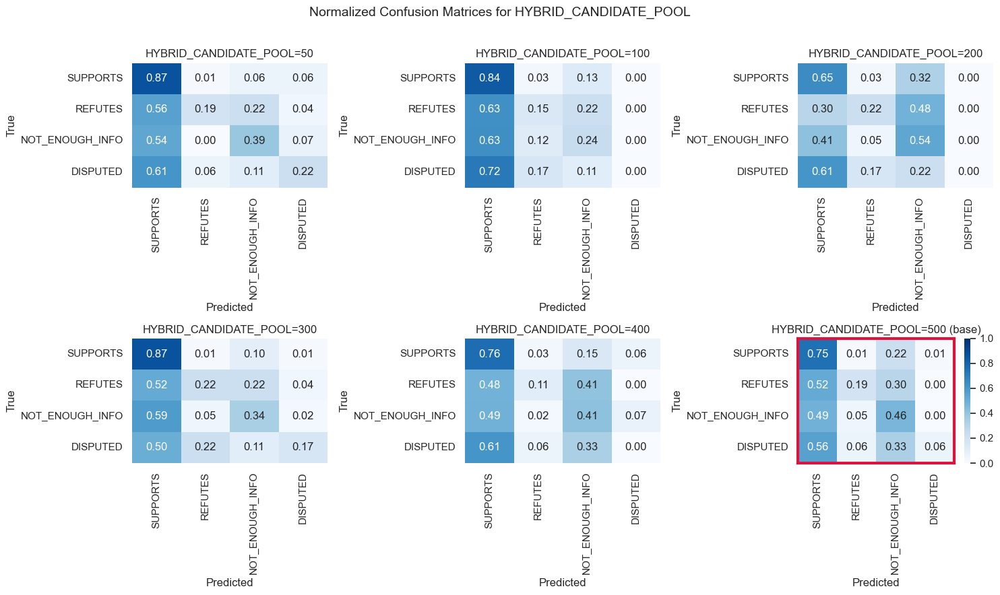


=== Normalized Confusion Matrix Comparison for RERANK_MODEL ===
Base value for RERANK_MODEL: all-MiniLM-L6-v2


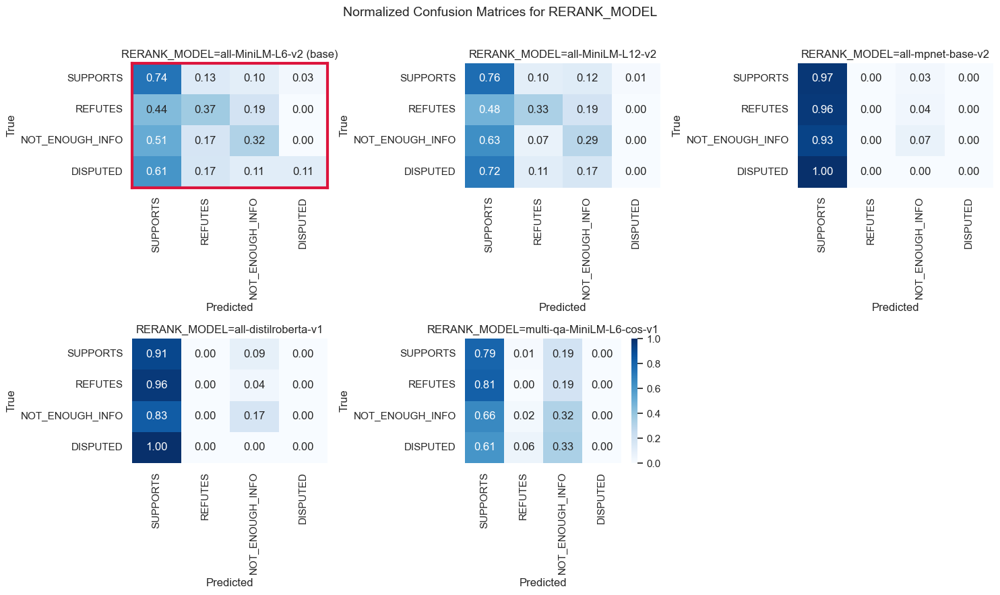


=== Normalized Confusion Matrix Comparison for TOP_K_RUNTIME ===
Base value for TOP_K_RUNTIME: 3


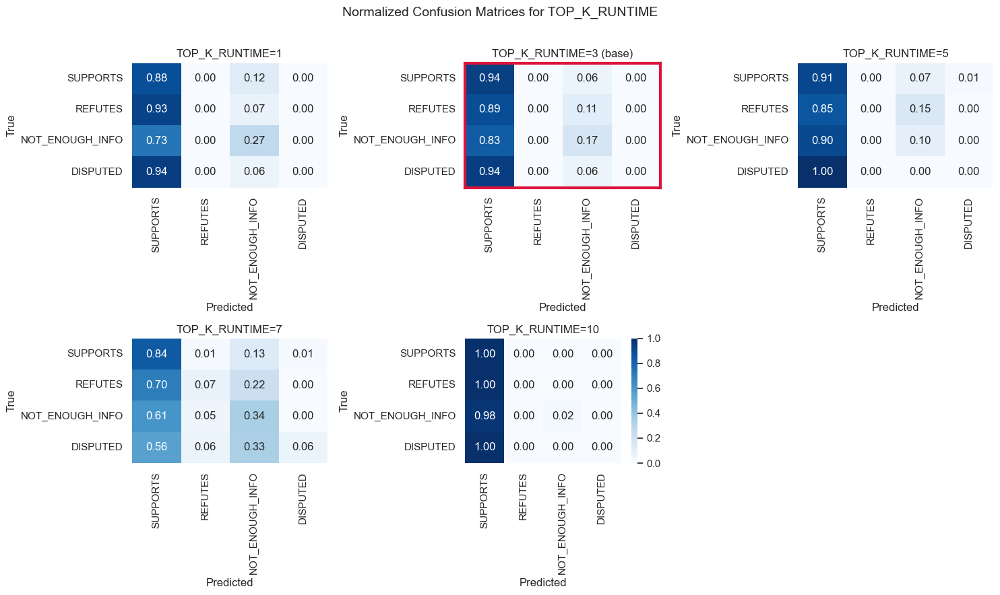


=== Normalized Confusion Matrix Comparison for SEMANTIC_RERANK_WEIGHT ===
Base value for SEMANTIC_RERANK_WEIGHT: 0.25


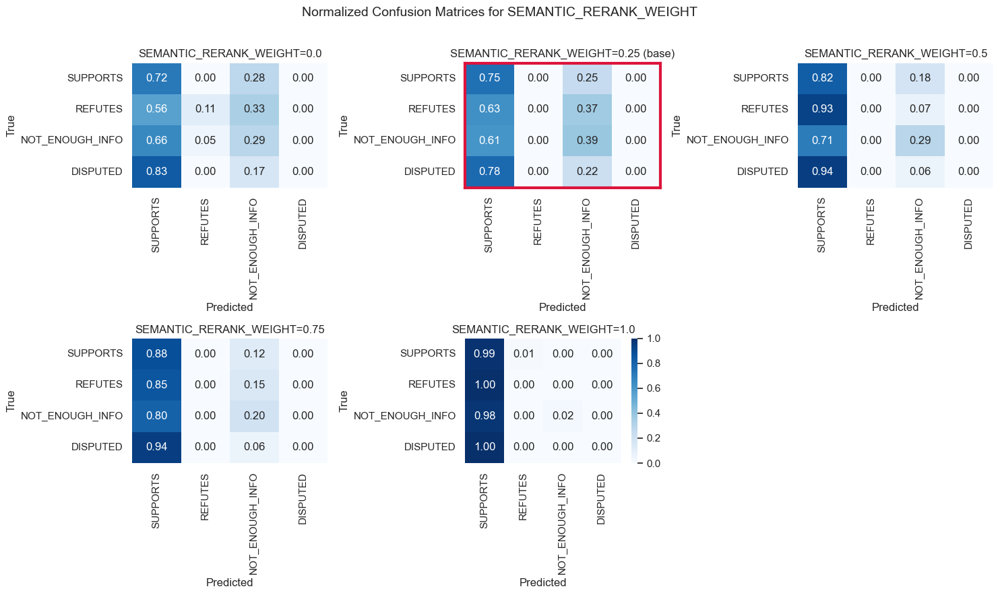


=== Normalized Confusion Matrix Comparison for SPARSE_RERANK_WEIGHT ===
Base value for SPARSE_RERANK_WEIGHT: 0.75


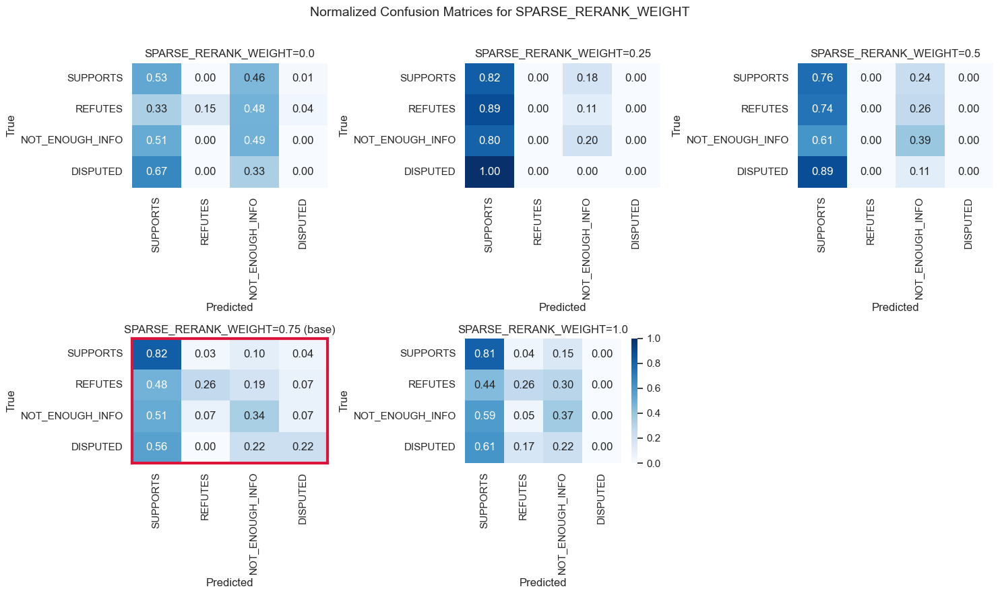


=== Normalized Confusion Matrix Comparison for MAIN_RETRIEVAL_METHOD ===
Base value for MAIN_RETRIEVAL_METHOD: hybrid_semantic


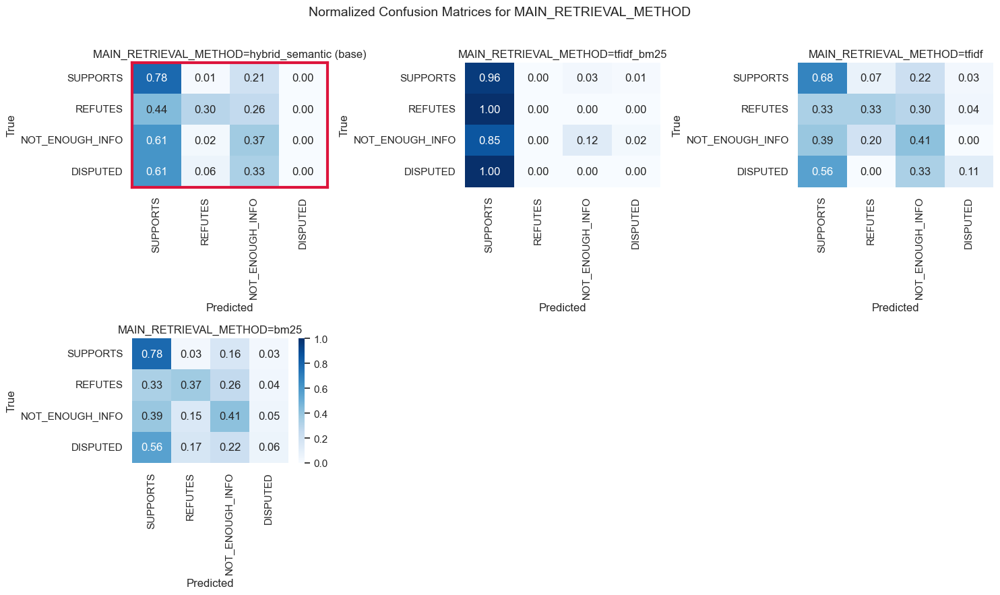


=== Normalized Confusion Matrix Comparison for TRAIN_EVIDENCE_MODE ===
Base value for TRAIN_EVIDENCE_MODE: retrieved


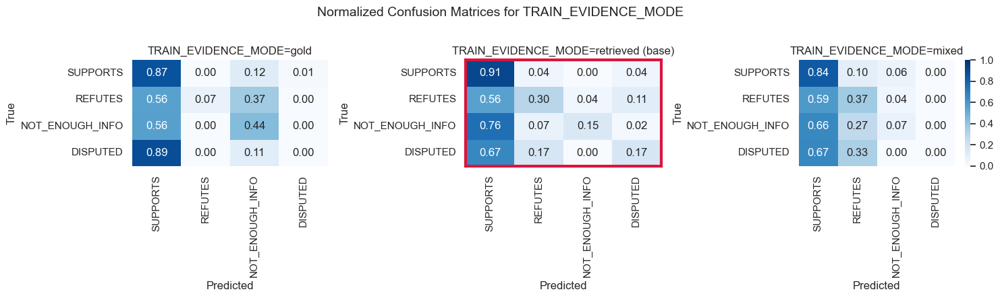


=== Normalized Confusion Matrix Comparison for CHECKPOINT_SELECTION_METRIC ===
Base value for CHECKPOINT_SELECTION_METRIC: accuracy


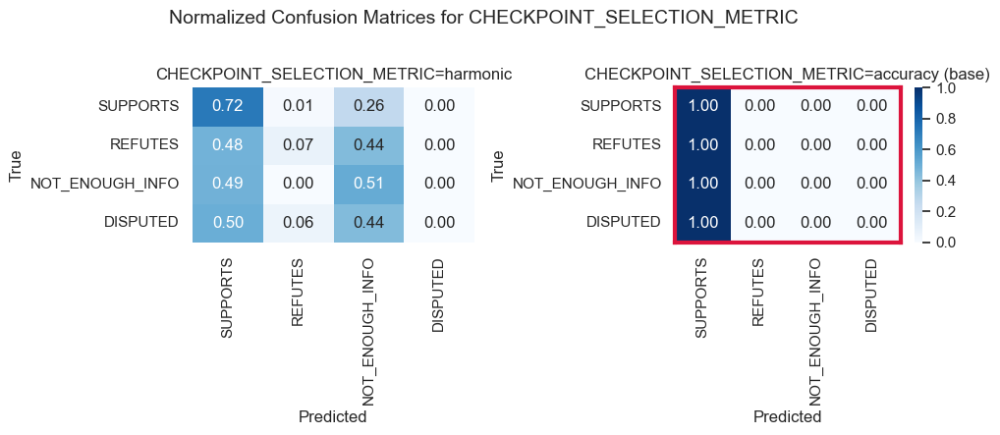


=== Normalized Confusion Matrix Comparison for CLASS_WEIGHT_POWER ===
Base value for CLASS_WEIGHT_POWER: 1.0


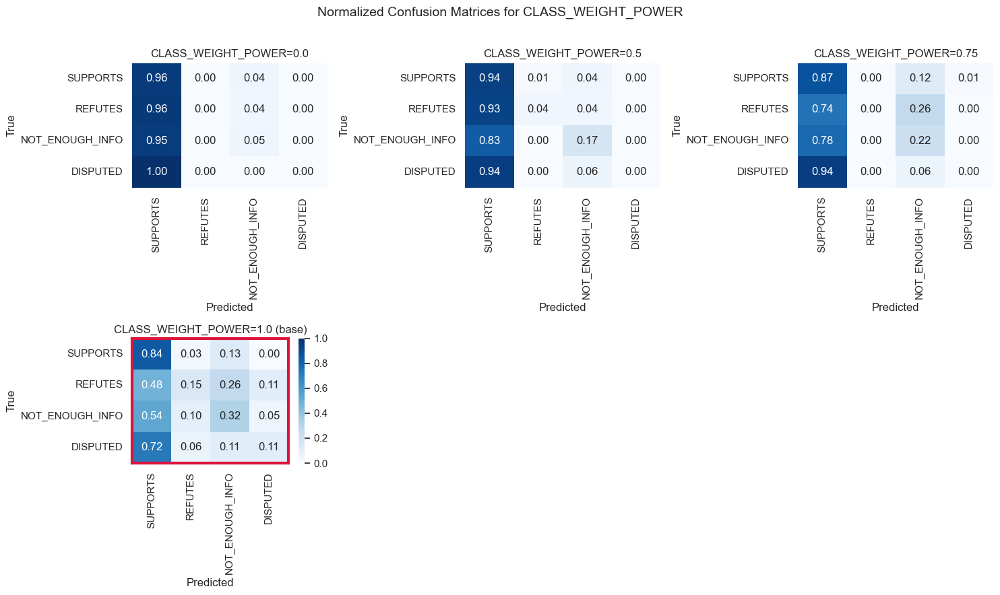


=== Normalized Confusion Matrix Comparison for MAX_LENGTH ===
Base value for MAX_LENGTH: 384


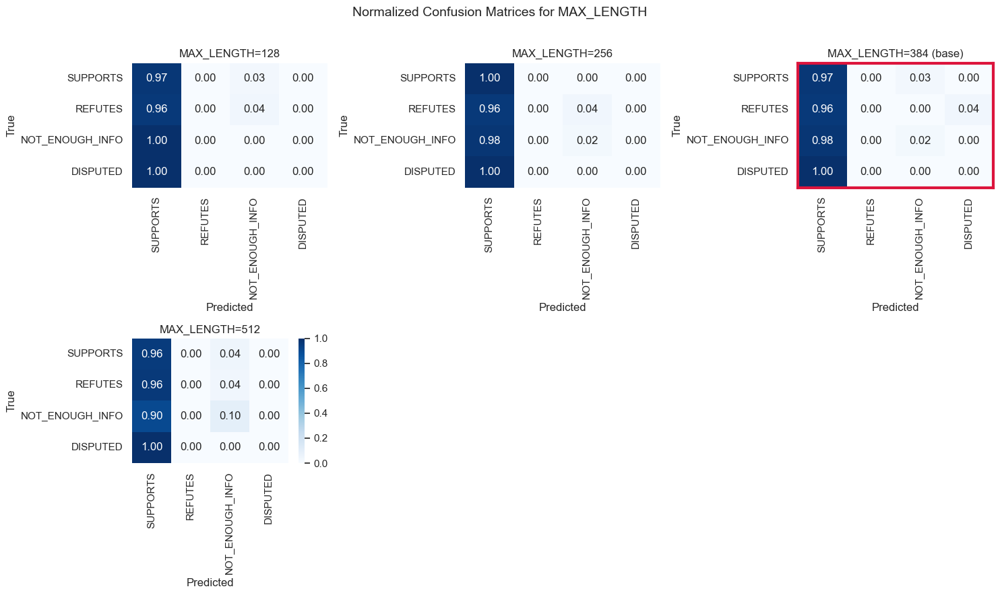


=== Normalized Confusion Matrix Comparison for NUM_EPOCHS ===
Base value for NUM_EPOCHS: 20


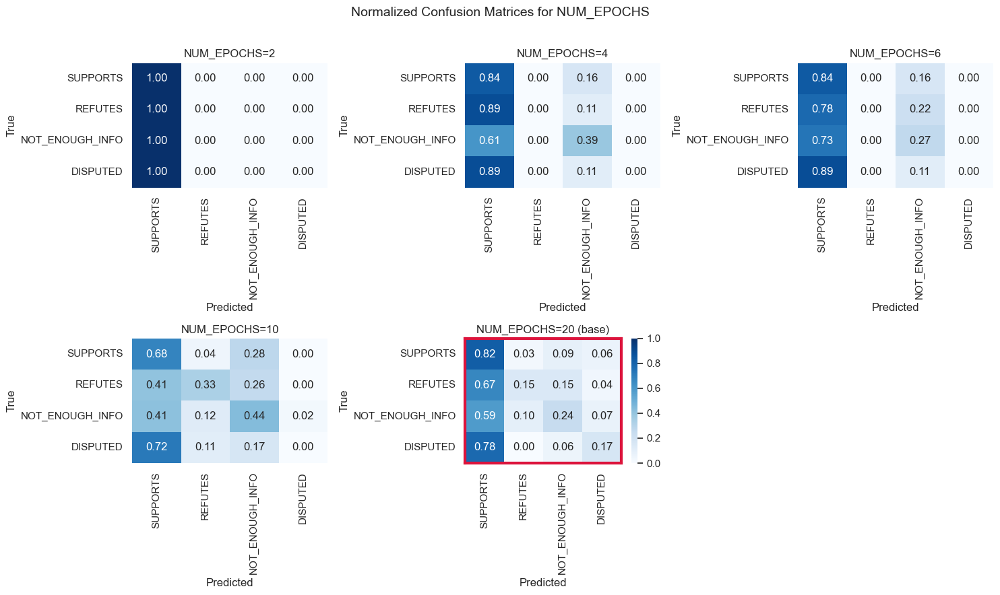


=== Normalized Confusion Matrix Comparison for LEARNING_RATE ===
Base value for LEARNING_RATE: 3e-05


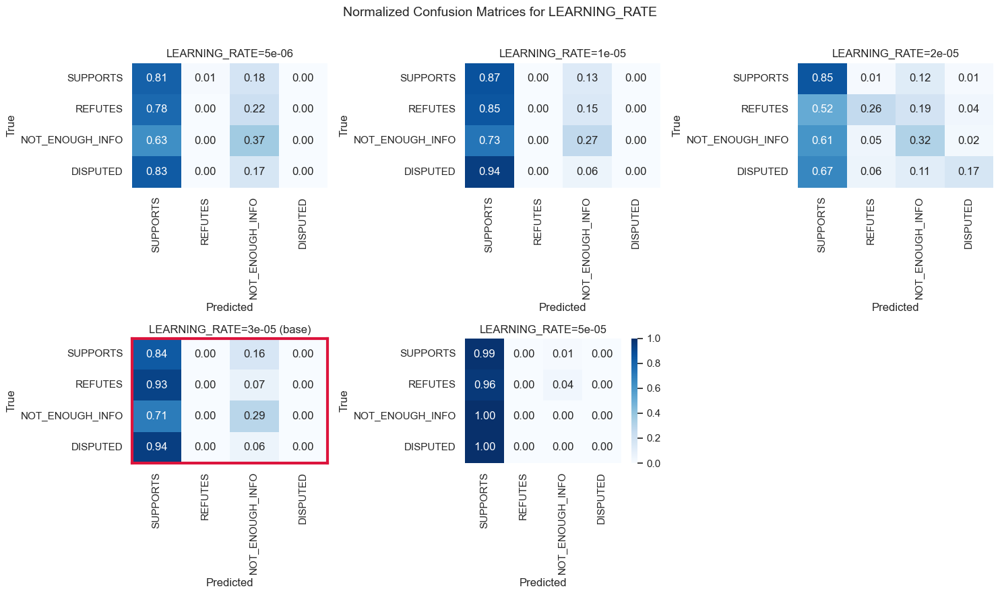


=== Normalized Confusion Matrix Comparison for WARMUP_RATIO ===
Base value for WARMUP_RATIO: 0.05


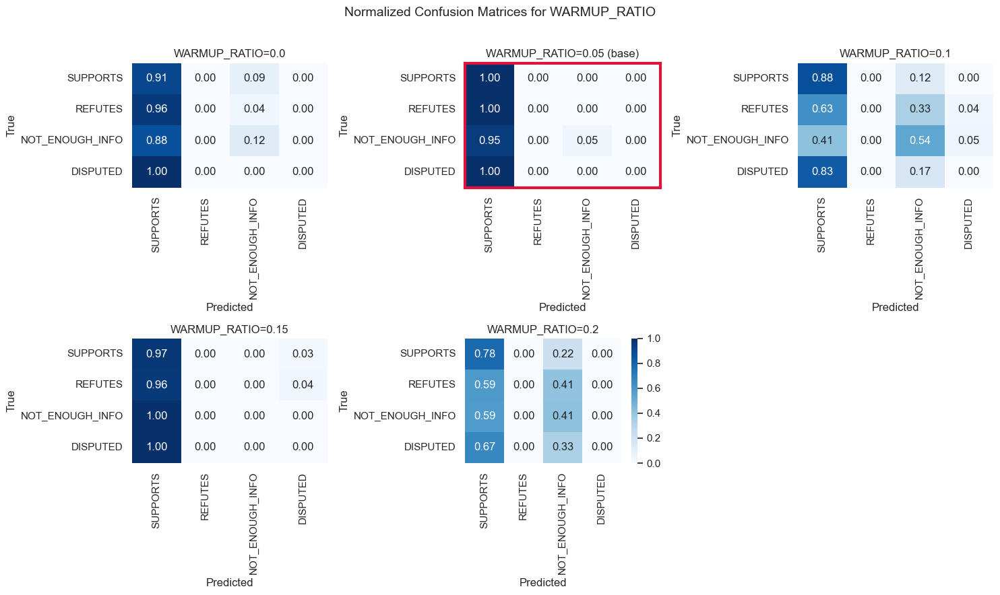


=== Normalized Confusion Matrix Comparison for WEIGHT_DECAY ===
Base value for WEIGHT_DECAY: 0.0


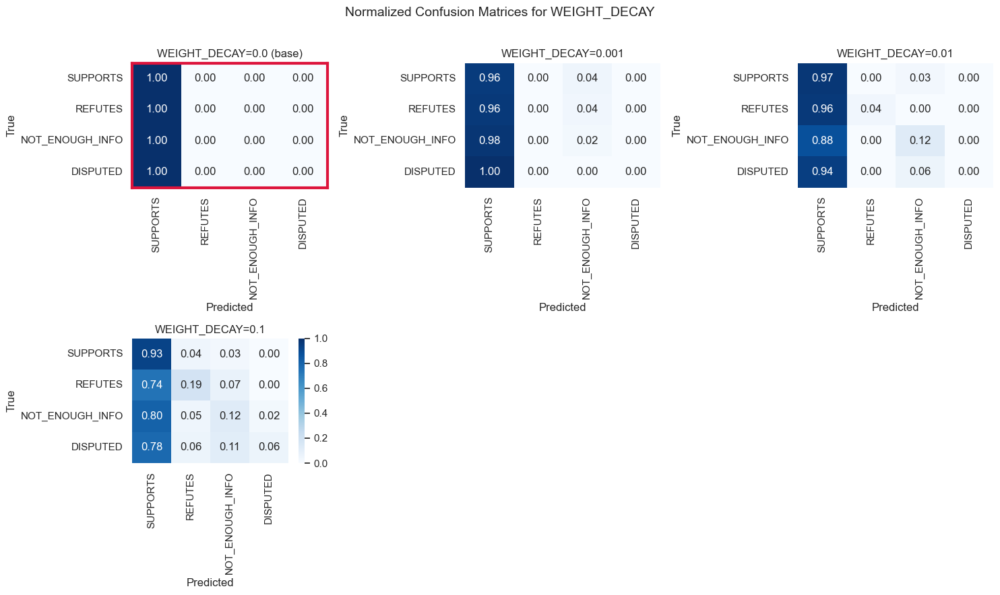


=== Diagnostic Summary for MODEL_NAME ===


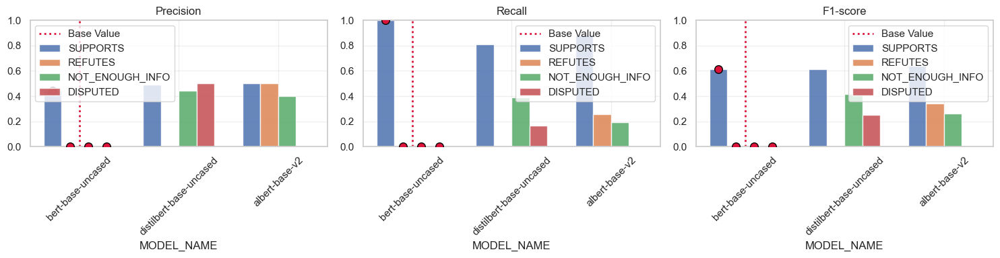


=== Diagnostic Summary for TOP_K ===


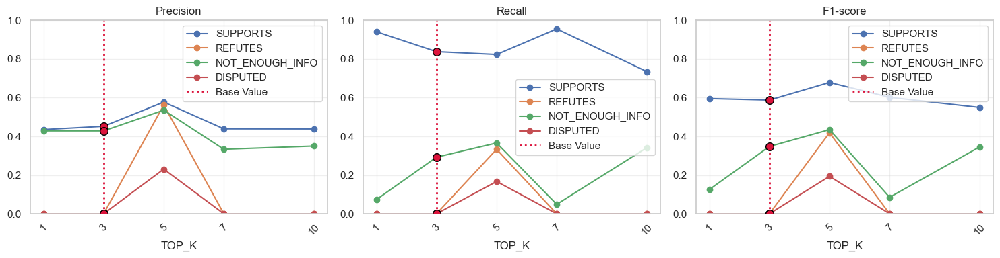


=== Diagnostic Summary for TFIDF_MAX_FEATURES ===


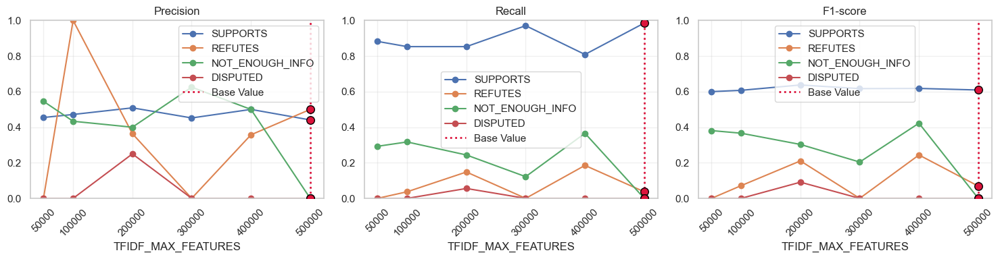


=== Diagnostic Summary for HYBRID_CANDIDATE_POOL ===


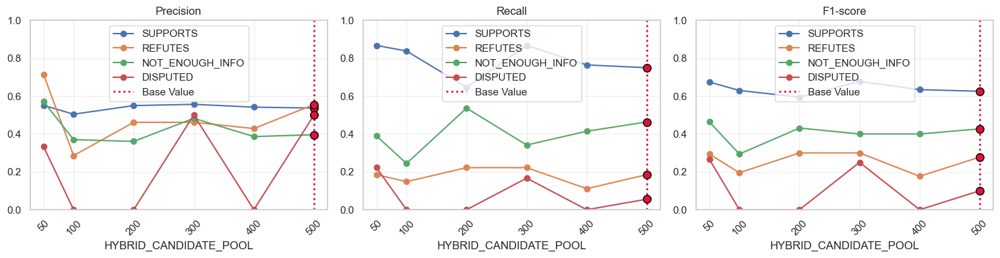


=== Diagnostic Summary for RERANK_MODEL ===


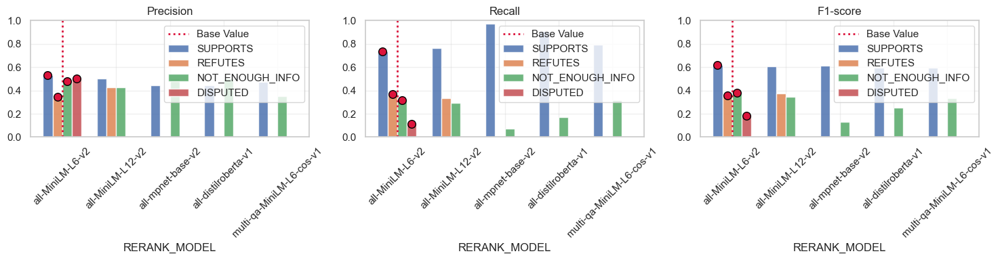


=== Diagnostic Summary for TOP_K_RUNTIME ===


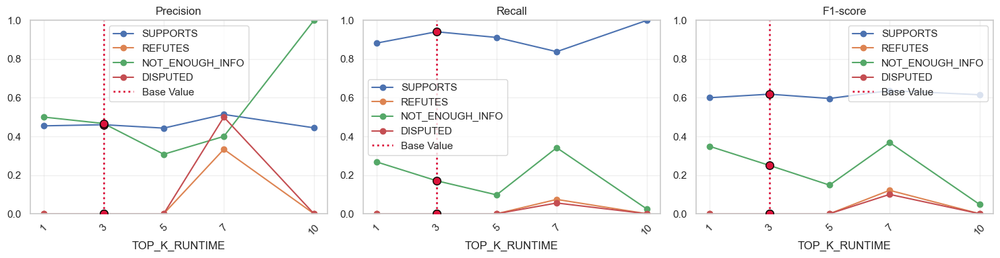


=== Diagnostic Summary for SEMANTIC_RERANK_WEIGHT ===


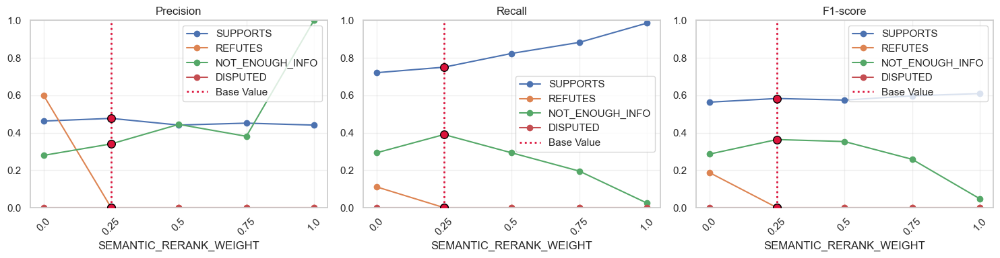


=== Diagnostic Summary for SPARSE_RERANK_WEIGHT ===


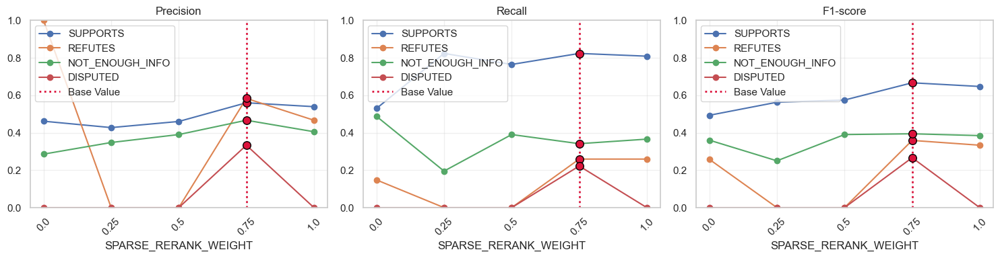


=== Diagnostic Summary for MAIN_RETRIEVAL_METHOD ===


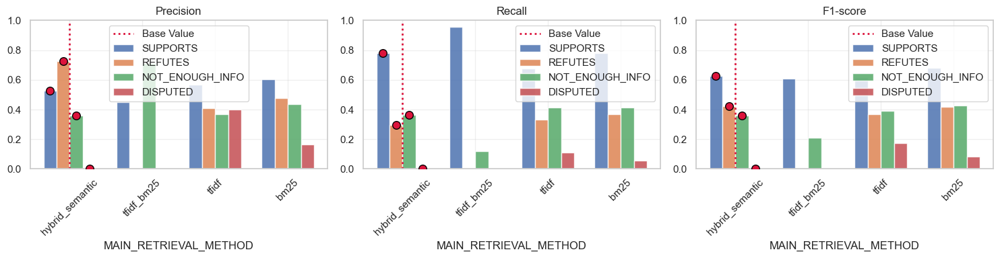


=== Diagnostic Summary for TRAIN_EVIDENCE_MODE ===


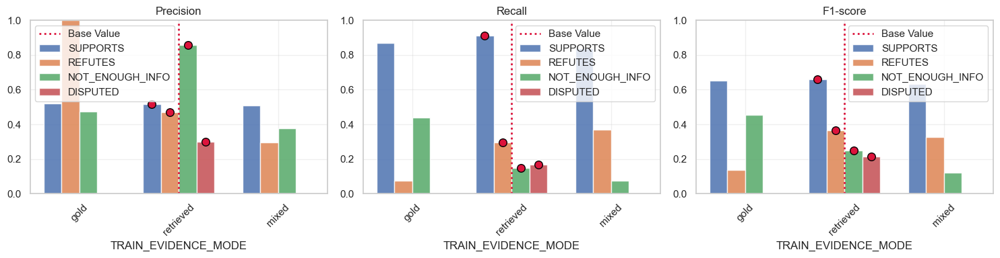


=== Diagnostic Summary for CHECKPOINT_SELECTION_METRIC ===


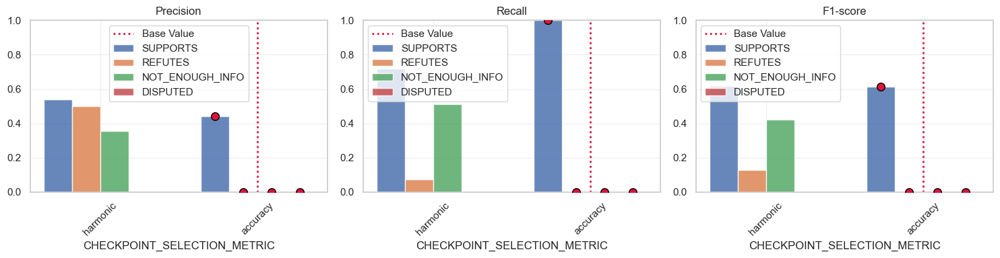


=== Diagnostic Summary for CLASS_WEIGHT_POWER ===


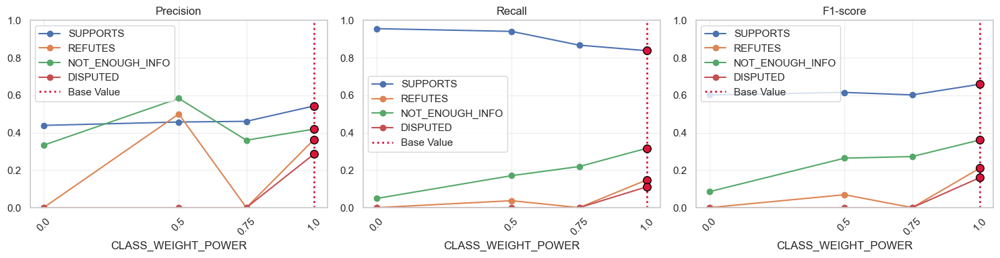


=== Diagnostic Summary for MAX_LENGTH ===


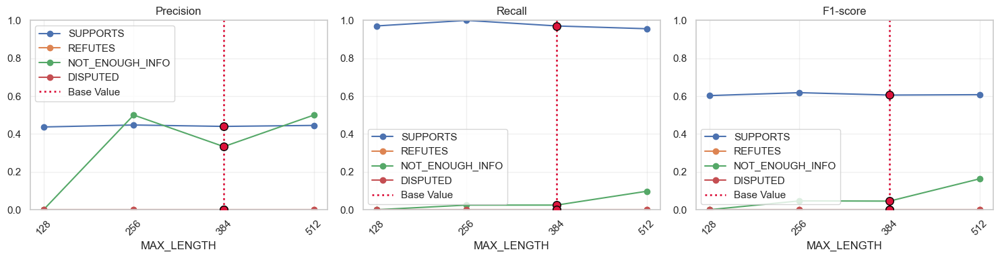


=== Diagnostic Summary for NUM_EPOCHS ===


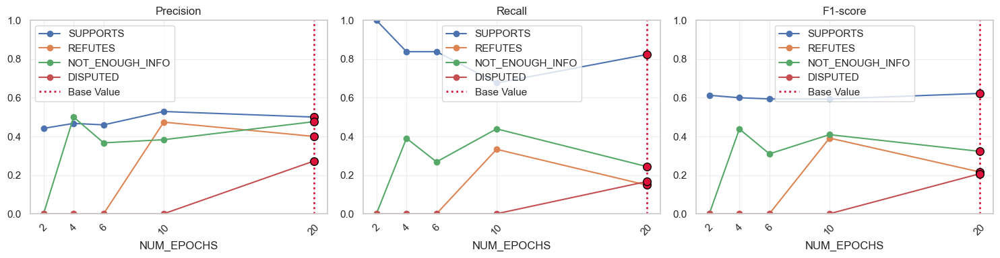


=== Diagnostic Summary for LEARNING_RATE ===


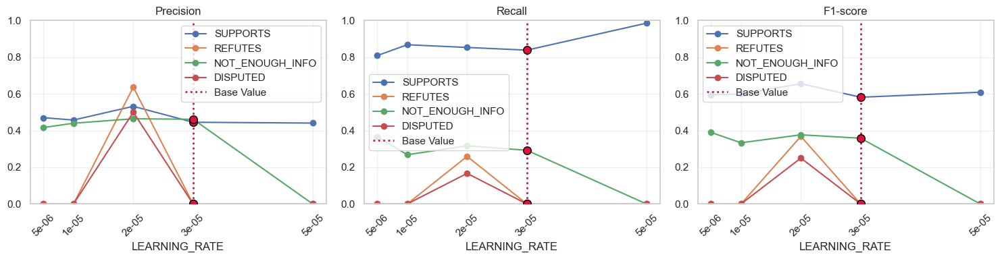


=== Diagnostic Summary for WARMUP_RATIO ===


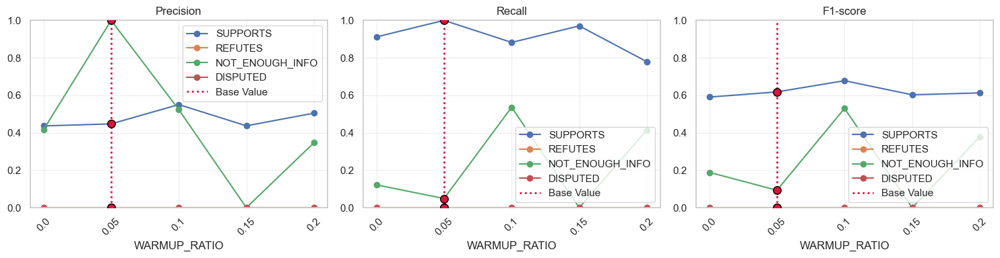


=== Diagnostic Summary for WEIGHT_DECAY ===


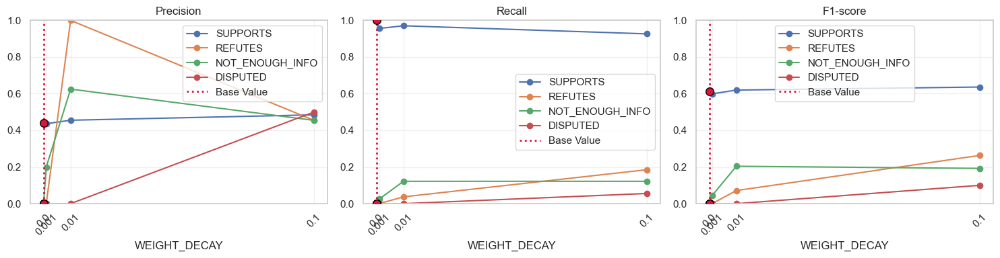

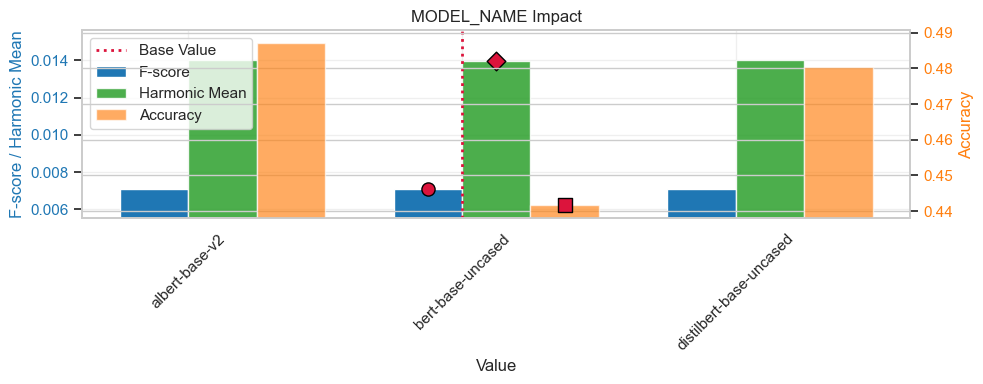

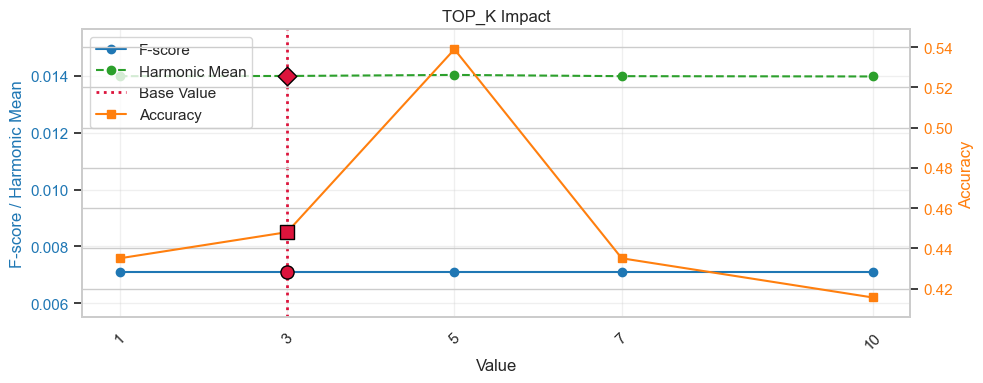

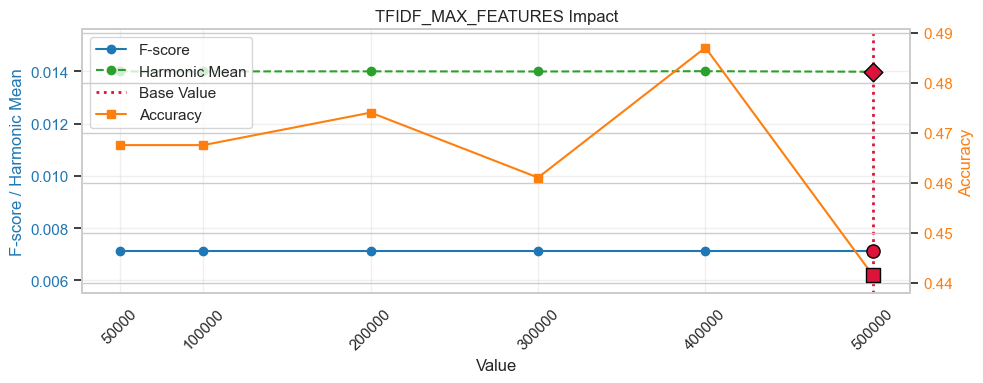

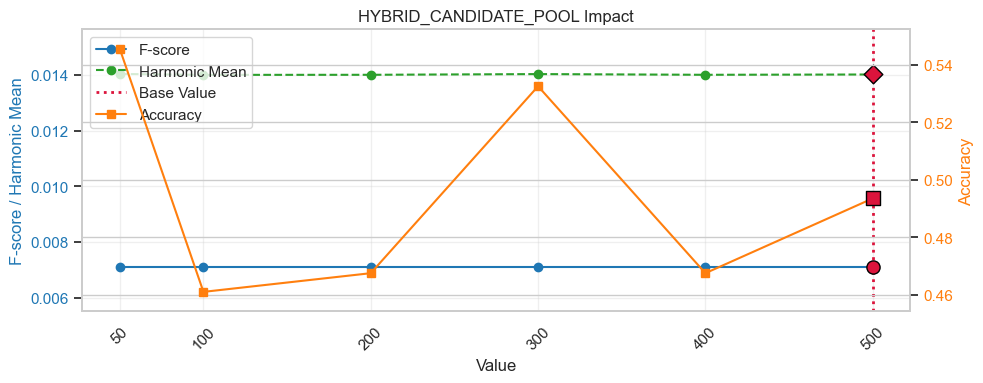

...

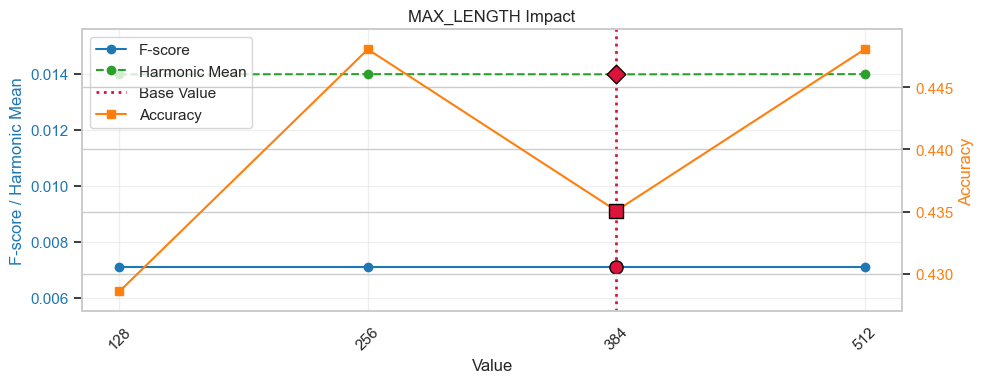

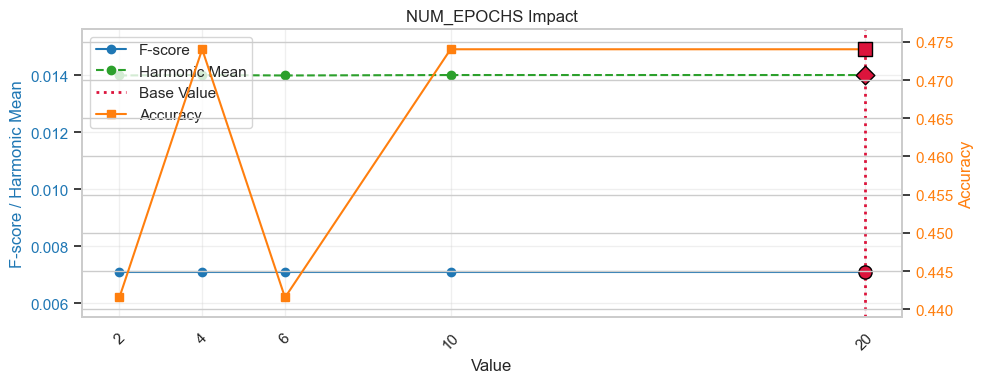

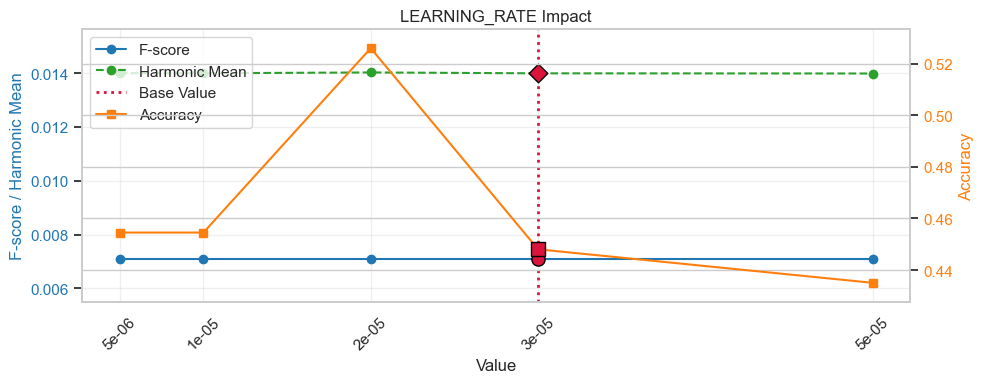

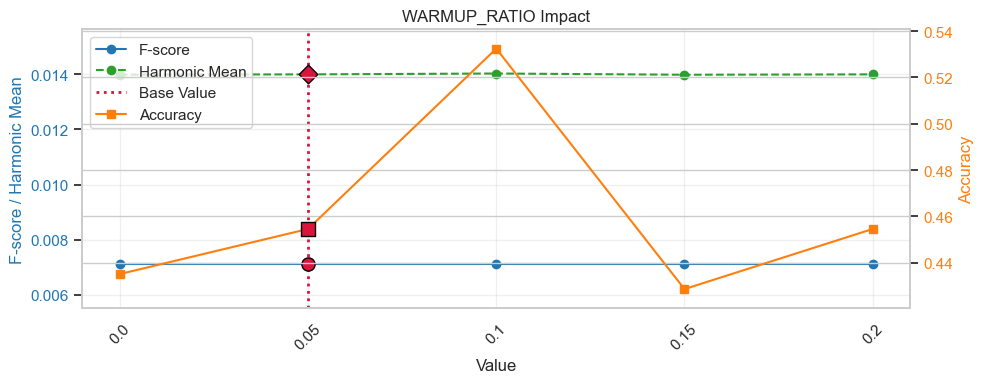

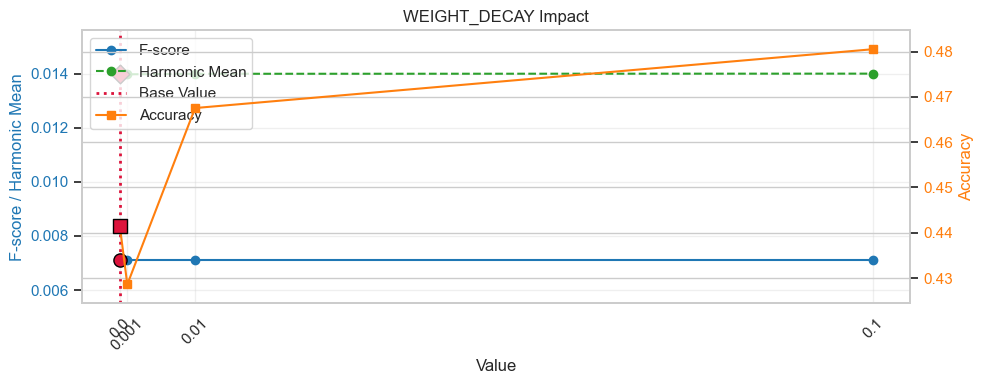

In [243]:
## Run the diagnostic plots for the grouped experiments

##clear the output directory first
for file in graph_dir.glob("*"):
    if file.is_file():
        file.unlink()

date="2026-05-22_13-17-54"
   
base=base_hyperparameters.get(f"base_hyper_params_{date}.json", {})
variant_experiments = json_data.get(f"bert_experiment_results_{date}_variants.json", {})

print(get_latex_table_from_experiments(variant_experiments, base_hyperparameters))

confusion_matrices_from_variants(variant_experiments, base_hyperparameters=base)
diagnostic_plots_grouped(variant_experiments, base_hyperparameters=base)
plot_hyperparameter_impacts(variant_experiments, base_hyperparameters=base)